In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import cv2
import matplotlib.pyplot as plt

In [ ]:
import os
import cv2

def get_data(train_dir="/content/drive/MyDrive/HF-Project/train/train", test_dir="/content/drive/MyDrive/HF-Project/test/test", face_cas="/content/haarcascade_frontalface_default.xml", eye_cas="/content/haarcascade.xml"):
    labels = ['Angry', 'Fear', 'Happy', 'Neutral', 'Sad']
    IMG_SIZE = 145
    data = []

    # Training data
    for label in labels:
        train_path = os.path.join(train_dir, label)
        class_num = labels.index(label)
        class_num += 5
        for img in os.listdir(train_path):
            try:
                img_array = cv2.imread(os.path.join(train_path, img), cv2.IMREAD_COLOR)
                resized_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
                data.append([resized_array, class_num])
            except Exception as e:
                print(e)

    # Testing data
    for label in labels:
        test_path = os.path.join(test_dir, label)
        class_num = labels.index(label)
        class_num += 5
        for img in os.listdir(test_path):
            try:
                img_array = cv2.imread(os.path.join(test_path, img), cv2.IMREAD_COLOR)
                resized_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
                data.append([resized_array, class_num])
            except Exception as e:
                print(e)

    return data

# Example usage:
# data = get_data()


In [ ]:
new_data= get_data()

OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'



In [ ]:
X = []
y = []
for feature, label in new_data:
    X.append(feature)
    y.append(label)

In [ ]:
X = np.array(X)
X = X.reshape(-1, 145, 145, 3)

In [ ]:
from sklearn.preprocessing import LabelBinarizer
label_bin = LabelBinarizer()
y = label_bin.fit_transform(y)

In [ ]:
y = np.array(y)

In [ ]:
from sklearn.model_selection import train_test_split
seed = 42
test_size = 0.30
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

In [ ]:
# Further split training data into training and validation sets
validation_size = 0.20  # 20% of training data for validation
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, random_state=seed, test_size=validation_size)

In [ ]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

In [ ]:
train_generator = ImageDataGenerator(rescale=1/255, zoom_range=0.2, horizontal_flip=True, rotation_range=30)
test_generator = ImageDataGenerator(rescale=1/255)

train_generator = train_generator.flow(np.array(X_train), y_train, shuffle=False)
test_generator = test_generator.flow(np.array(X_test), y_test, shuffle=False)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 143, 143, 256)     7168      
                                                                 
 max_pooling2d (MaxPooling2  (None, 71, 71, 256)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 69, 69, 128)       295040    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 34, 34, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        73792     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 16, 16, 64)        0

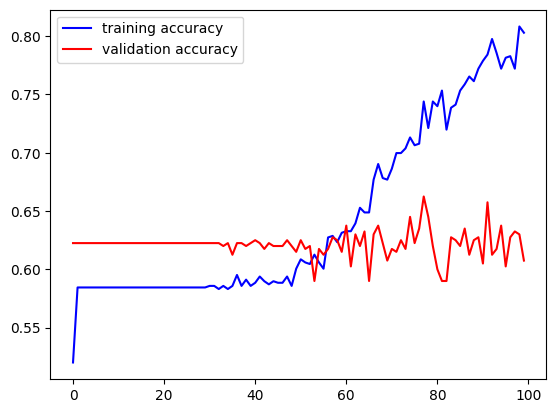

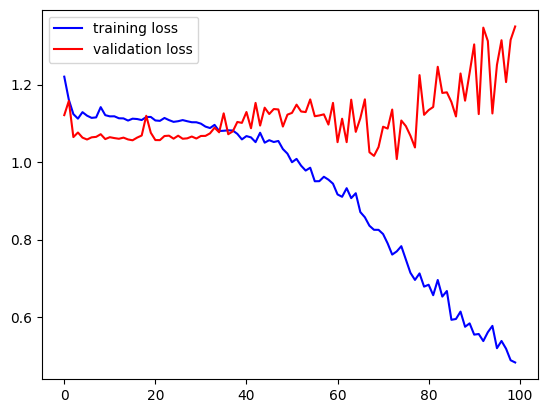

13/13 [==============================] - 0s 23ms/step


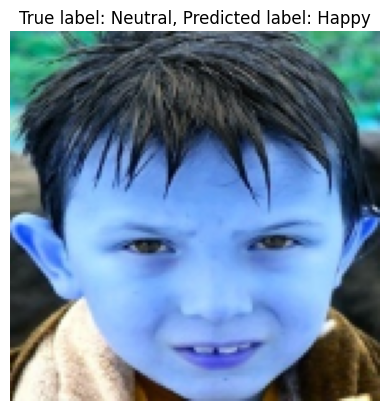

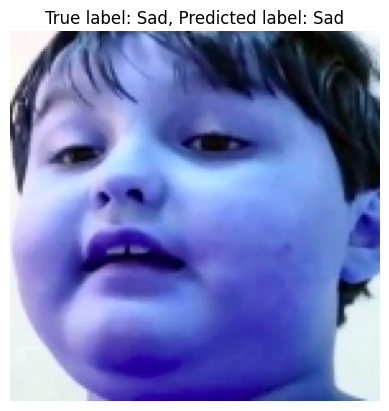

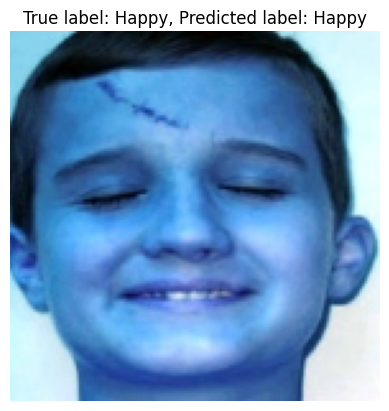

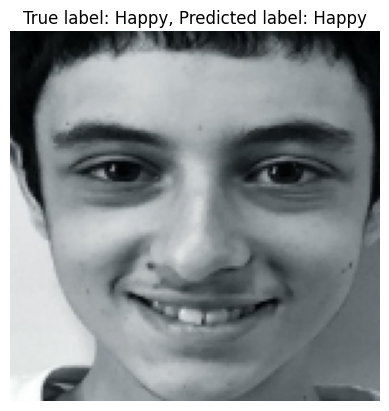

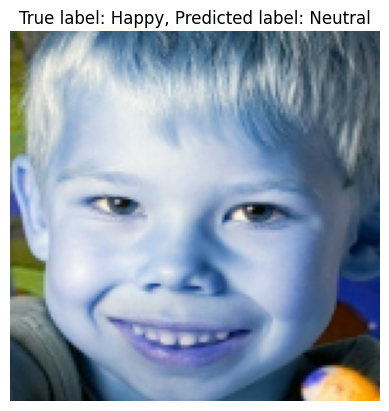

...

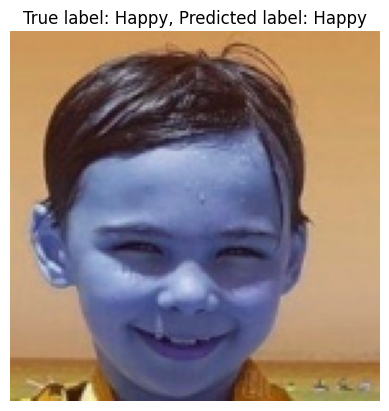

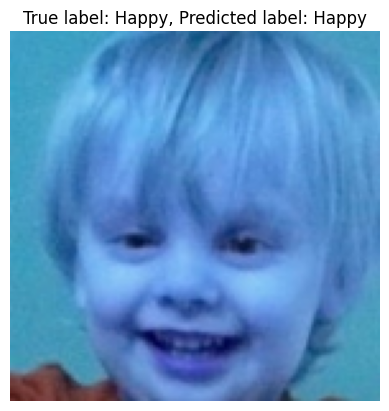

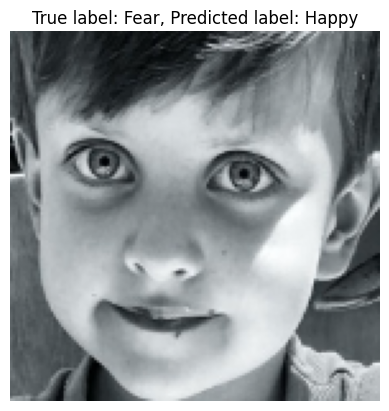

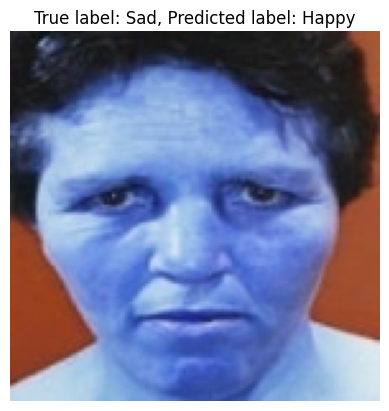

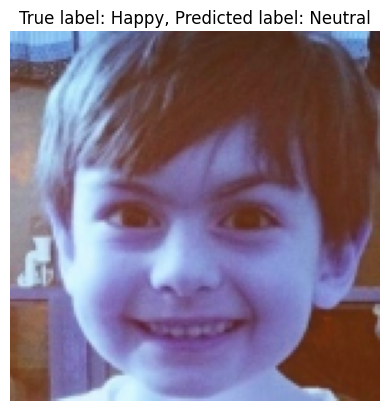

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from sklearn.metrics import classification_report

# Define ImageDataGenerator for data normalization
test_datagen = ImageDataGenerator(rescale=1/255)

# Create generator objects
test_generator = test_datagen.flow(X_test, y_test, shuffle=False)

# Define the model
model = Sequential()

model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(X_train.shape[1:])))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64, activation="relu"))
model.add(Dense(5, activation="softmax"))

model.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer="adam")

model.summary()

# Train the model
history = model.fit(train_generator, epochs=100, validation_data=test_generator, validation_steps=len(test_generator))

# Evaluate the model on test data
evaluation = model.evaluate(test_generator)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))

plt.plot(epochs, accuracy, "b", label="training accuracy")
plt.plot(epochs, val_accuracy, "r", label="validation accuracy")
plt.legend()
plt.show()

plt.plot(epochs, loss, "b", label="training loss")
plt.plot(epochs, val_loss, "r", label="validation loss")
plt.legend()
plt.show()


import matplotlib.pyplot as plt

# Predict on test data
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["Angry", "Fear", "Happy", "Neutral","Sad"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()




In [ ]:
from sklearn.metrics import classification_report

# Get predicted classes and true classes
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Manually specify class labels
class_labels = ["Angry", "Fear", "Happy", "Neutral","Sad"]

# Generate classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(report)


13/13 [==============================] - 0s 24ms/step
Classification Report:
              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00         6
        Fear       0.00      0.00      0.00        15
       Happy       0.73      0.83      0.78       249
     Neutral       0.34      0.33      0.33        92
         Sad       0.29      0.18      0.23        38

    accuracy                           0.61       400
   macro avg       0.27      0.27      0.27       400
weighted avg       0.56      0.61      0.58       400



**CRNN**

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 143, 143, 32)      896       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 71, 71, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 69, 69, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 34, 34, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 16, 16, 128)      

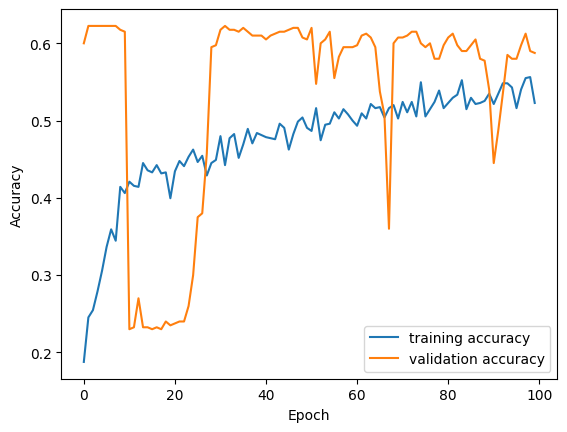

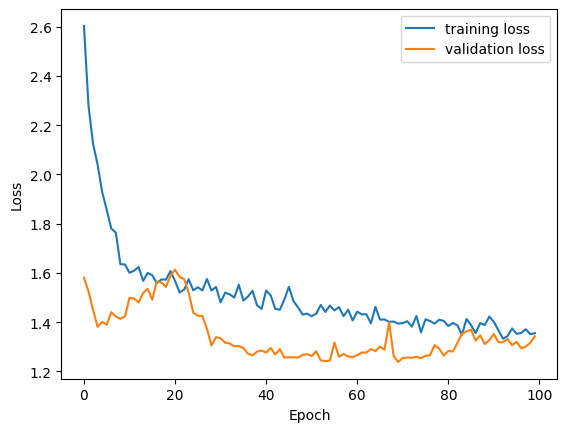

13/13 [==============================] - 1s 14ms/step


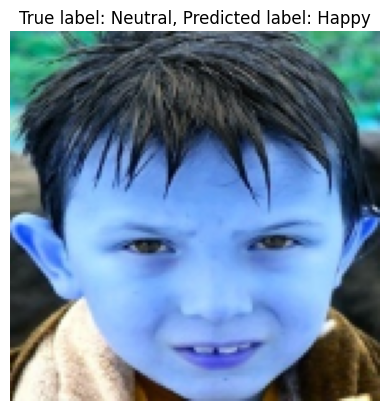

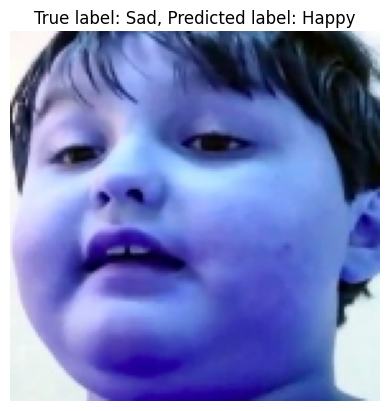

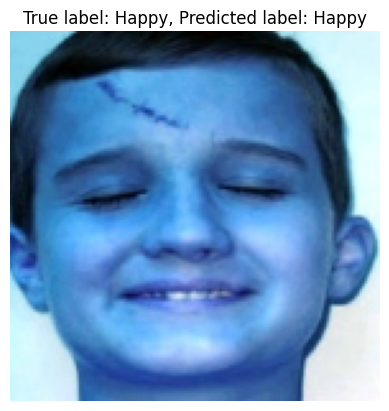

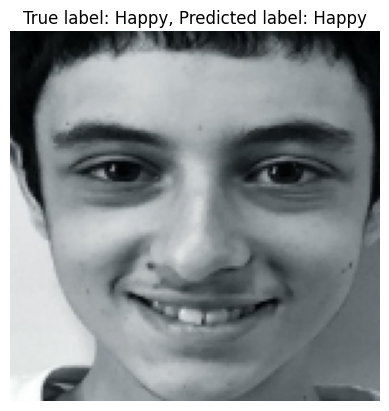

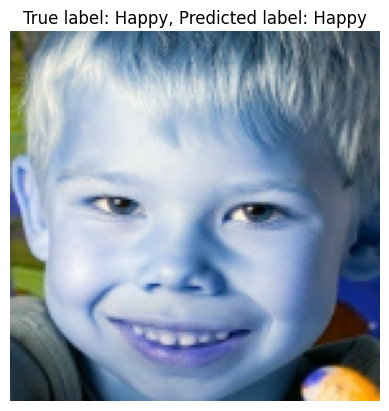

...

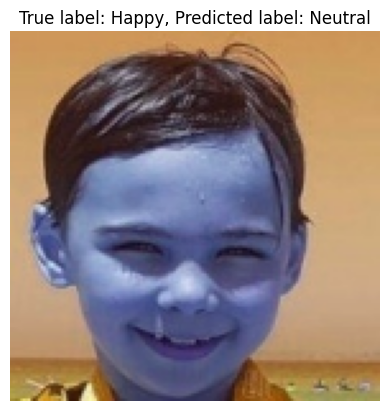

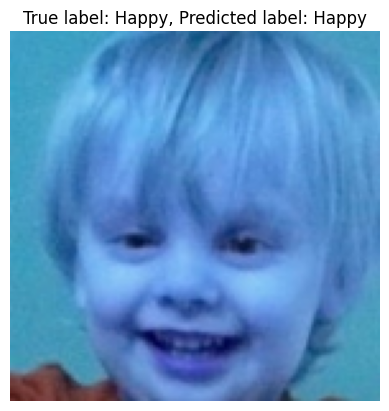

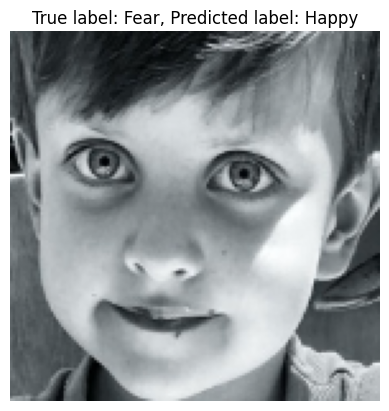

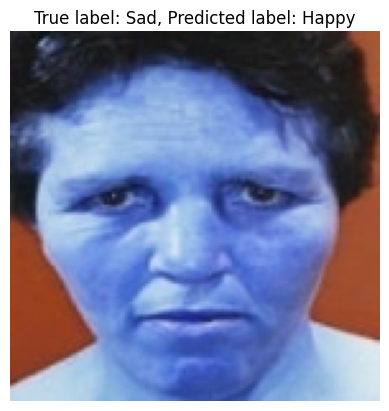

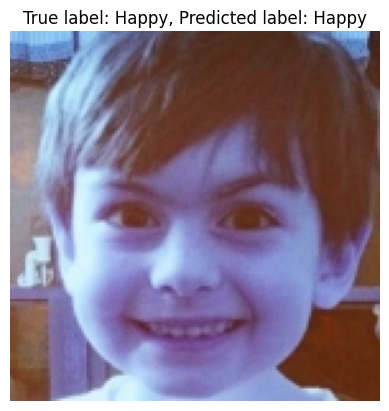

              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00         6
        Fear       0.00      0.00      0.00        15
       Happy       0.62      0.92      0.74       249
     Neutral       0.23      0.08      0.11        92
         Sad       0.00      0.00      0.00        38

    accuracy                           0.59       400
   macro avg       0.17      0.20      0.17       400
weighted avg       0.44      0.59      0.49       400



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau
from keras.constraints import max_norm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())

    # Recurrent layers
    model.add(Reshape((-1, 128)))  # Reshape for LSTM
    model.add(LSTM(256, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    model.add(LSTM(128, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    model.add(LSTM(128, activation="tanh"))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    # Fully connected layers
    model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001), kernel_constraint=max_norm(3)))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(num_classes, activation="softmax"))

    return model

# Define model
crnn_model = build_crnn_model(input_shape=X_train.shape[1:], num_classes=5)

# Compile model
optimizer = Adam(lr=0.0005, clipnorm=1.0)
crnn_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Summary
crnn_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

# Training
history = crnn_model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), callbacks=[reduce_lr])

# Evaluation on test data
evaluation = crnn_model.evaluate(X_test, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = crnn_model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)

class_labels = ["Angry", "Fear", "Happy", "Neutral","Sad"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


**hybrid model**

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 143, 143, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 71, 71, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_11 (Conv2D)          (None, 69, 69, 64)        18496     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 34, 34, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 16, 16, 128)      

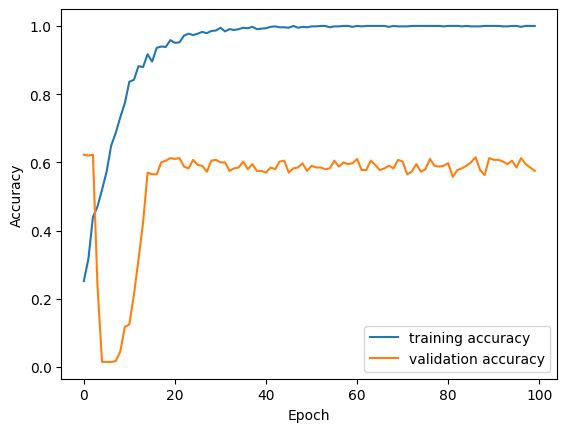

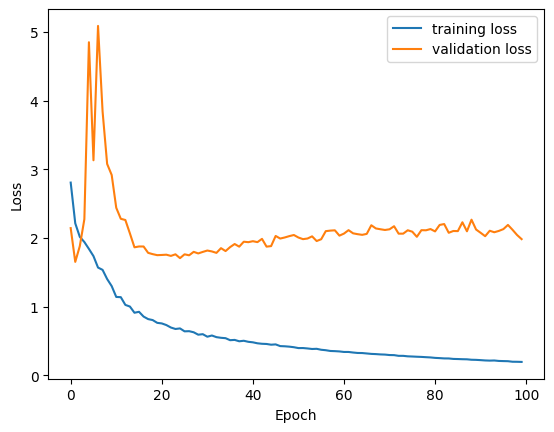

13/13 [==============================] - 1s 8ms/step


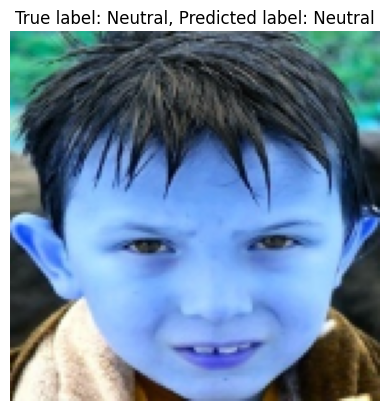

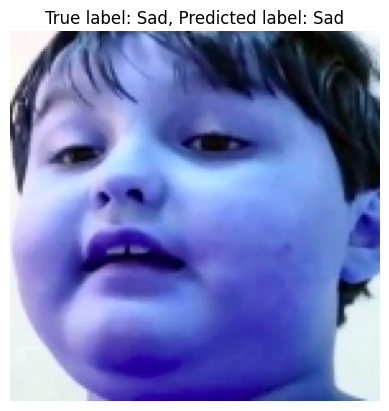

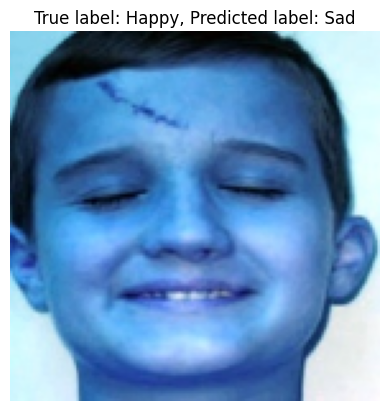

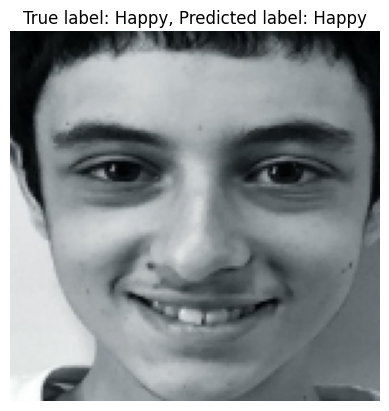

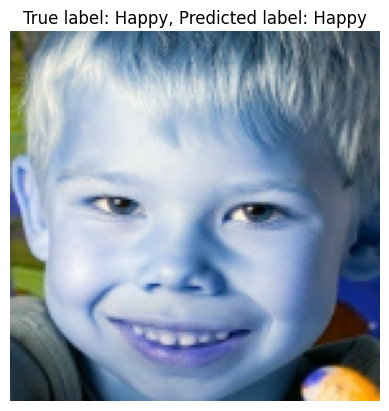

...

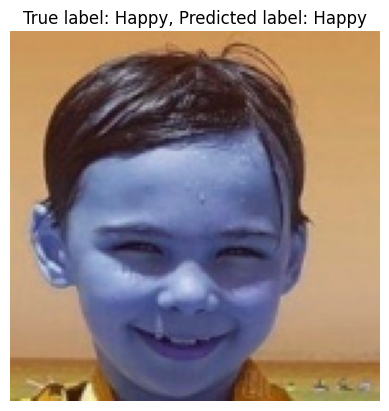

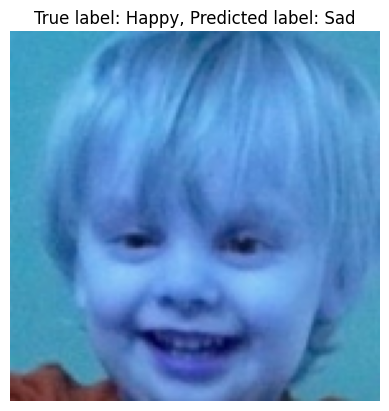

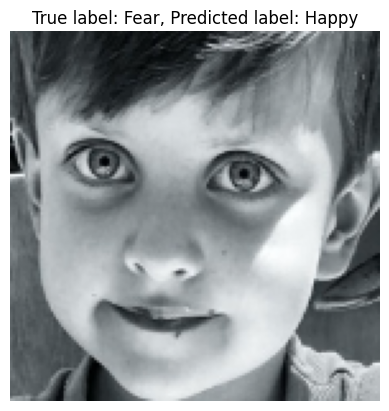

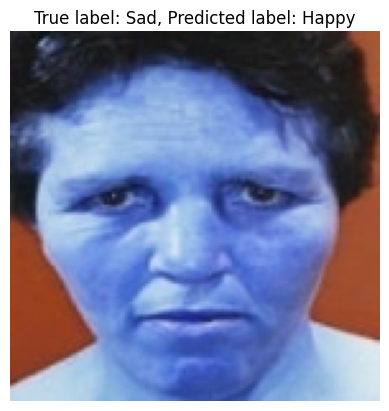

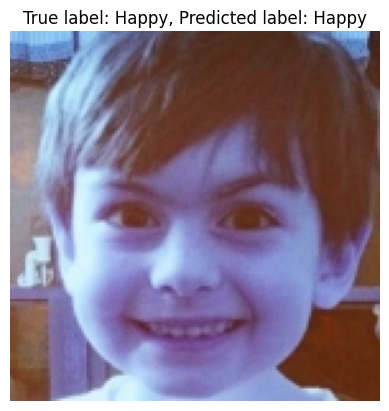

              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00         6
        Fear       0.00      0.00      0.00        15
       Happy       0.71      0.81      0.76       249
     Neutral       0.29      0.26      0.27        92
         Sad       0.22      0.13      0.16        38

    accuracy                           0.57       400
   macro avg       0.24      0.24      0.24       400
weighted avg       0.53      0.57      0.55       400



In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau
from keras.constraints import max_norm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def build_hybrid_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())

    # LSTM layer
    model.add(Reshape((-1, 128)))  # Reshape for LSTM
    model.add(LSTM(256, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    # Fully connected layers
    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001), kernel_constraint=max_norm(3)))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(num_classes, activation="softmax"))

    return model

# Define model
hybrid_model = build_hybrid_model(input_shape=X_train.shape[1:], num_classes=5)

# Compile model
optimizer = Adam(lr=0.0005, clipnorm=1.0)
hybrid_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Summary
hybrid_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

# Training
history = hybrid_model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), callbacks=[reduce_lr])

# Evaluation on test data
evaluation = hybrid_model.evaluate(X_test, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = hybrid_model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = ["Angry", "Fear", "Happy", "Neutral","Sad"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


**Transfer Learning**

58889256/58889256 [==============================] - 0s 0us/step


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_5 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 512)               12845568  
                                                                 
 batch_normalization_10 (Ba  (None, 512)               2048      
 tchNormalization)                                               
                                                                 
 dropout_10 (Dropout)        (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


13/13 [==============================] - 1s 90ms/step - loss: 2.4100 - accuracy: 0.6450
Test Loss: 2.4100217819213867
Test Accuracy: 0.6449999809265137


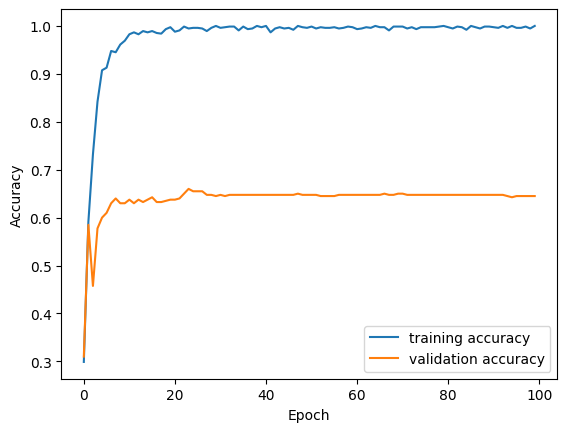

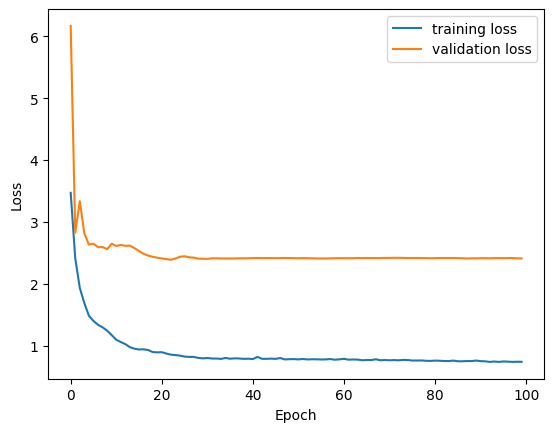

13/13 [==============================] - 1s 91ms/step


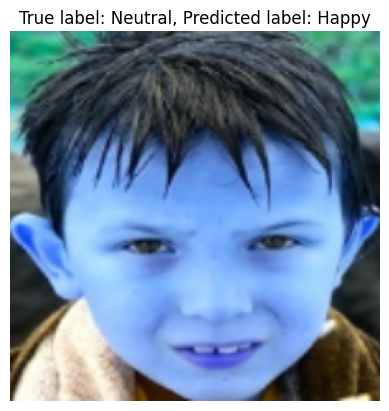

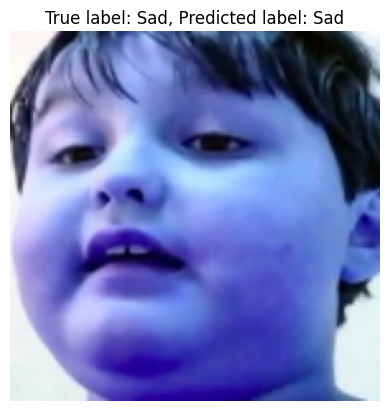

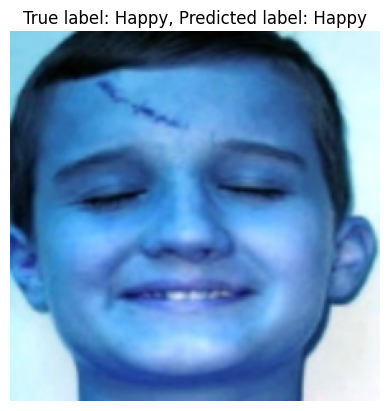

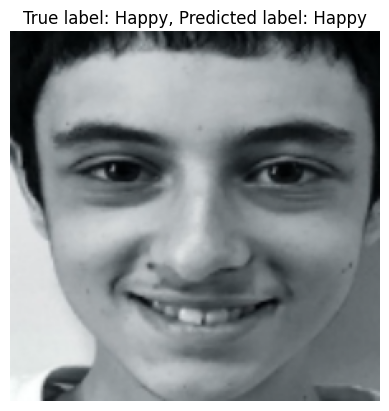

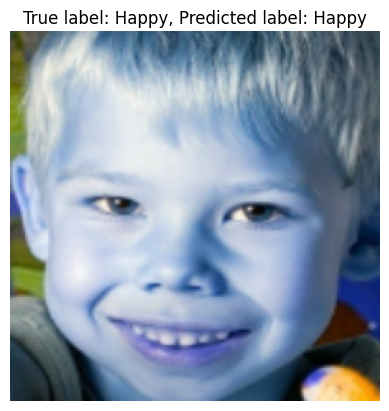

...

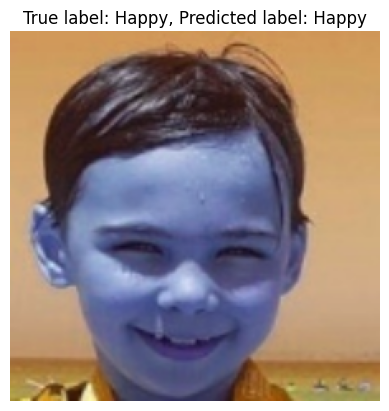

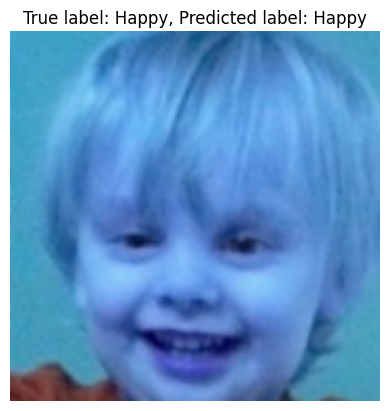

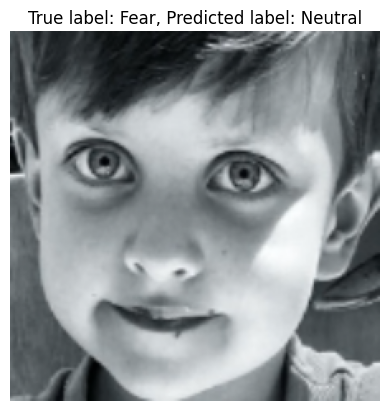

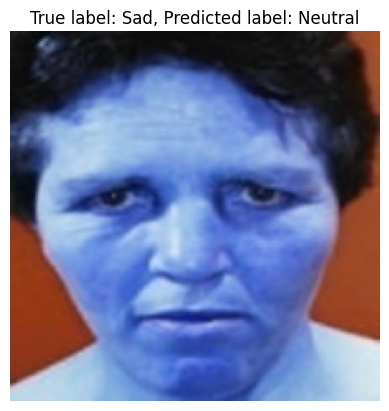

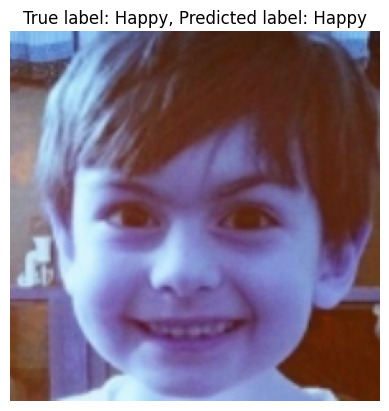

              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00         6
        Fear       1.00      0.07      0.12        15
       Happy       0.77      0.86      0.81       249
     Neutral       0.39      0.42      0.40        92
         Sad       0.22      0.11      0.14        38

    accuracy                           0.65       400
   macro avg       0.48      0.29      0.30       400
weighted avg       0.62      0.65      0.62       400



In [ ]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau
from keras.regularizers import l2
from keras.preprocessing.image import img_to_array, array_to_img
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Resize input images
X_train_resized = np.array([cv2.resize(img, (224, 224)) for img in X_train])
X_test_resized = np.array([cv2.resize(img, (224, 224)) for img in X_test])

# Load pre-trained VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model
transfer_model = Sequential()

# Add the pre-trained VGG16 base model
transfer_model.add(base_model)

# Flatten the output of VGG16 base model
transfer_model.add(Flatten())

# Add fully connected layers
transfer_model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.001)))
transfer_model.add(BatchNormalization())
transfer_model.add(Dropout(0.5))

transfer_model.add(Dense(256, activation='relu', kernel_regularizer=l2(0.001)))
transfer_model.add(BatchNormalization())
transfer_model.add(Dropout(0.5))

transfer_model.add(Dense(5, activation='softmax'))

# Compile the model
optimizer = Adam(lr=0.0001)
transfer_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Summary
transfer_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = transfer_model.fit(X_train_resized, y_train, epochs=100, batch_size=32, validation_data=(X_test_resized, y_test), callbacks=[reduce_lr])

# Save the model
transfer_model.save("transfer_model.h5")

# Evaluation on test data
evaluation = transfer_model.evaluate(X_test_resized, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = transfer_model.predict(X_test_resized)
predicted_classes = np.argmax(predictions, axis=1)

class_labels = ["Angry", "Fear", "Happy", "Neutral","Sad"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(array_to_img(X_test_resized[i]))
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))
